In [4]:
import numpy as np
import matplotlib.pylab as pl

import glob

from params.sys_params import *   ## add this folder to PYTHONPATH internal
import tools.selecter as sel

In [18]:
pl.rcParams["savefig.format"]  ; print(_)#.png
output_folder = "/VELA06_F435W"
output_dir        = python_dir + "/DATA_outputs"+output_folder                  ; print("output_dir:       ",output_dir)
output_graphs_dir = python_dir + "/DATA_outputs/processed_images"+output_folder ; print("output_graphs_dir:",output_graphs_dir)
dataraw_dir       = python_dir + "/DATA"+output_folder                          ; print("dataraw_dir:      ",dataraw_dir)

['/notebooks/CLUMPS_VELA/python_work/DATA_outputs/VELA06_F435W']
output_dir:        /notebooks/CLUMPS_VELA/python_work/DATA_outputs/VELA06_F435W
output_graphs_dir: /notebooks/CLUMPS_VELA/python_work/DATA_outputs/processed_images/VELA06_F435W
dataraw_dir:       /notebooks/CLUMPS_VELA/python_work/DATA/VELA06_F435W


In [9]:
list_output  = glob.glob(output_dir+'/*.npy')      ; [print(npy.split("/")[-1]) for npy in list_output] ; print("\n")
list_dataraw = glob.glob(dataraw_dir+'/*.fits')    ; print(len(list_dataraw),"images in",dataraw_dir)

imgs_247_09_18_18.npy
img_masks_247_09_18_18.npy
img_test-247_09_18_18.npy


247 images in /notebooks/CLUMPS_VELA/python_work/DATA/VELA06_F435W


In [10]:
imgs      = np.load(list_output[0]) #; print(imgs)
imgs_mask = np.load(list_output[1]) #; print(imgs_mask)
imgs_test = np.load(list_output[2]) #; print(imgs_test)

In [11]:
#-group_images-# : After recognition with the model Unet, it shows in the same figure the "real image", "binary mask", and the "output"
def group_images(i):
    fig=pl.figure(); 
    ax1=fig.add_subplot(1,3,1); ax1.imshow(imgs[i])         # REAL IMAGE
    ax2=fig.add_subplot(1,3,2); ax2.imshow(imgs_mask[i])    # BINARY MASK    
    ax3=fig.add_subplot(1,3,3); ax3.imshow(imgs_test[i])    # OUTPUT OF UNET
    return

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


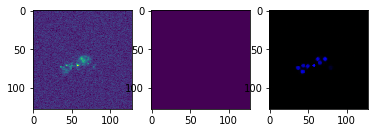

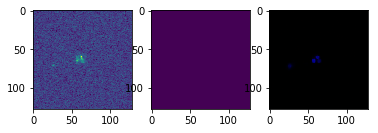

In [12]:
#i.e.
group_images(10)
group_images(100)
#group_images(103)

In [13]:
imgs[1].any == 0
#print(imgs[i][1])
for i in range(0,128):
    print(max(imgs[1][i]))

0.005512524861842394
0.004280730616301298
0.007182857021689415
0.005645306780934334
0.0070703295059502125
0.004651978146284819
0.0043975673615932465
0.004921579733490944
0.0059044077061116695
0.006984555162489414
0.005956015549600124
0.004761295393109322
0.005923519842326641
0.004498031921684742
0.0049380892887711525
0.006082368548959494
0.004976269789040089
0.004844270646572113
0.004407851025462151
0.005024106707423925
0.004952433984726667
0.005292475689202547
0.004817696288228035
0.004802234470844269
0.004132868722081184
0.005348274949938059
0.00487697497010231
0.005090809427201748
0.005855864379554987
0.004629629198461771
0.004449841100722551
0.005758553743362427
0.0056511154398322105
0.0049326797015964985
0.004630176350474358
0.005414966493844986
0.005309282802045345
0.005077941343188286
0.004570057615637779
0.004278745502233505
0.006106080487370491
0.006134015042334795
0.004762379918247461
0.00468341913074255
0.003842451609671116
0.004868622869253159
0.005137590225785971
0.0044562

In [18]:
imgs_test[1].any == 0
imgs_test[1][:,:,0].shape #;print(_)
imgs_test[1][:,:,1].shape #;print(_)
imgs_test[1][:,:,2].shape #;print(_)


(128, 128)

In [ ]:
###---<IMAGENES_PNG_'processed_images'>---###

In [ ]:
#imgs_test[:,:,0]#imgs
for i in range(0,len(list_dataraw)):
    pl.imshow(imgs_test[i][:,:,0])
    pl.savefig(output_graphs_dir + '/img['+str(i)+']')

In [ ]:
#imgs_test[:,:,1] #imgs_mask
for i in range(0,len(list_dataraw)):
    pl.imshow(imgs_test[i][:,:,1])
    pl.savefig(output_graphs_dir + '/imgs_mask['+str(i)+']')

In [ ]:
#imgs_test[:,:,3] #prediction #img_pred
for i in range(0,len(list_dataraw)):
    pl.imshow(imgs_test[i][:,:,2])
    pl.savefig(output_graphs_dir + '/imgs_pred['+str(i)+']')

In [ ]:
from astropy.io import fits
fits.writeto("test.fits",imgs_test[1],,overwrite=True)
fits.writeto("test_pred.fits",imgs_test[1][:,:,2],overwrite=True)

In [14]:
real_im=[];pred_im=[] ; binmask_im=[]
for i in range(0,len(list_dataraw)):
    #print(imgs_test[i][:,:,2])
    real_im.append(imgs_test[i][:,:,0])     #real images
    pred_im.append(imgs_test[i][:,:,2])     #predicted images
    
    #binmask_im.append(imgs_test[i][:,:,1])      #binarymask images
    print(pred_im)
    '''
    
    filename_pred_im = list_dataraw[i].split("/")[-1].split(".fits")[0] ; print(filename_pred_im) 
    pred_im
        hdul.writeto(output_dir+"/"+filename_pred_im+"-pred.fits")
    
    '''

[array([[-0.08272628, -0.07827937, -0.06899743, ..., -0.04240743,
        -0.07820949, -0.05910393],
       [-0.10076314, -0.08247467, -0.05853766, ..., -0.03483603,
        -0.08200682, -0.08438601],
       [-0.09185982, -0.07032958, -0.04108494, ..., -0.04118605,
        -0.05618563, -0.06411694],
       ...,
       [-0.15245676, -0.13038307, -0.08253284, ..., -0.08120713,
        -0.12600802, -0.12787166],
       [-0.20445406, -0.21747231, -0.18063527, ..., -0.1601404 ,
        -0.19581284, -0.1762802 ],
       [-0.19224952, -0.22560671, -0.20634228, ..., -0.18459211,
        -0.20485695, -0.16697977]])]
[array([[-0.08272628, -0.07827937, -0.06899743, ..., -0.04240743,
        -0.07820949, -0.05910393],
       [-0.10076314, -0.08247467, -0.05853766, ..., -0.03483603,
        -0.08200682, -0.08438601],
       [-0.09185982, -0.07032958, -0.04108494, ..., -0.04118605,
        -0.05618563, -0.06411694],
       ...,
       [-0.15245676, -0.13038307, -0.08253284, ..., -0.08120713,
       

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[array([[-0.08272628, -0.07827937, -0.06899743, ..., -0.04240743,
        -0.07820949, -0.05910393],
       [-0.10076314, -0.08247467, -0.05853766, ..., -0.03483603,
        -0.08200682, -0.08438601],
       [-0.09185982, -0.07032958, -0.04108494, ..., -0.04118605,
        -0.05618563, -0.06411694],
       ...,
       [-0.15245676, -0.13038307, -0.08253284, ..., -0.08120713,
        -0.12600802, -0.12787166],
       [-0.20445406, -0.21747231, -0.18063527, ..., -0.1601404 ,
        -0.19581284, -0.1762802 ],
       [-0.19224952, -0.22560671, -0.20634228, ..., -0.18459211,
        -0.20485695, -0.16697977]]), array([[-0.08272606, -0.07827856, -0.06899685, ..., -0.0424074 ,
        -0.07820946, -0.05910392],
       [-0.10076211, -0.08247319, -0.05853539, ..., -0.03483603,
        -0.0820068 , -0.08438599],
       [-0.09185905, -0.07032785, -0.04108264, ..., -0.04118605,
        -0.05618563, -0.06411693],
       ...,
       [-0.15245678, -0.13038304, -0.08253279, ..., -0.08120714,
        

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[array([[-0.08272628, -0.07827937, -0.06899743, ..., -0.04240743,
        -0.07820949, -0.05910393],
       [-0.10076314, -0.08247467, -0.05853766, ..., -0.03483603,
        -0.08200682, -0.08438601],
       [-0.09185982, -0.07032958, -0.04108494, ..., -0.04118605,
        -0.05618563, -0.06411694],
       ...,
       [-0.15245676, -0.13038307, -0.08253284, ..., -0.08120713,
        -0.12600802, -0.12787166],
       [-0.20445406, -0.21747231, -0.18063527, ..., -0.1601404 ,
        -0.19581284, -0.1762802 ],
       [-0.19224952, -0.22560671, -0.20634228, ..., -0.18459211,
        -0.20485695, -0.16697977]]), array([[-0.08272606, -0.07827856, -0.06899685, ..., -0.0424074 ,
        -0.07820946, -0.05910392],
       [-0.10076211, -0.08247319, -0.05853539, ..., -0.03483603,
        -0.0820068 , -0.08438599],
       [-0.09185905, -0.07032785, -0.04108264, ..., -0.04118605,
        -0.05618563, -0.06411693],
       ...,
       [-0.15245678, -0.13038304, -0.08253279, ..., -0.08120714,
        

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[array([[-0.08272628, -0.07827937, -0.06899743, ..., -0.04240743,
        -0.07820949, -0.05910393],
       [-0.10076314, -0.08247467, -0.05853766, ..., -0.03483603,
        -0.08200682, -0.08438601],
       [-0.09185982, -0.07032958, -0.04108494, ..., -0.04118605,
        -0.05618563, -0.06411694],
       ...,
       [-0.15245676, -0.13038307, -0.08253284, ..., -0.08120713,
        -0.12600802, -0.12787166],
       [-0.20445406, -0.21747231, -0.18063527, ..., -0.1601404 ,
        -0.19581284, -0.1762802 ],
       [-0.19224952, -0.22560671, -0.20634228, ..., -0.18459211,
        -0.20485695, -0.16697977]]), array([[-0.08272606, -0.07827856, -0.06899685, ..., -0.0424074 ,
        -0.07820946, -0.05910392],
       [-0.10076211, -0.08247319, -0.05853539, ..., -0.03483603,
        -0.0820068 , -0.08438599],
       [-0.09185905, -0.07032785, -0.04108264, ..., -0.04118605,
        -0.05618563, -0.06411693],
       ...,
       [-0.15245678, -0.13038304, -0.08253279, ..., -0.08120714,
        

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[array([[-0.08272628, -0.07827937, -0.06899743, ..., -0.04240743,
        -0.07820949, -0.05910393],
       [-0.10076314, -0.08247467, -0.05853766, ..., -0.03483603,
        -0.08200682, -0.08438601],
       [-0.09185982, -0.07032958, -0.04108494, ..., -0.04118605,
        -0.05618563, -0.06411694],
       ...,
       [-0.15245676, -0.13038307, -0.08253284, ..., -0.08120713,
        -0.12600802, -0.12787166],
       [-0.20445406, -0.21747231, -0.18063527, ..., -0.1601404 ,
        -0.19581284, -0.1762802 ],
       [-0.19224952, -0.22560671, -0.20634228, ..., -0.18459211,
        -0.20485695, -0.16697977]]), array([[-0.08272606, -0.07827856, -0.06899685, ..., -0.0424074 ,
        -0.07820946, -0.05910392],
       [-0.10076211, -0.08247319, -0.05853539, ..., -0.03483603,
        -0.0820068 , -0.08438599],
       [-0.09185905, -0.07032785, -0.04108264, ..., -0.04118605,
        -0.05618563, -0.06411693],
       ...,
       [-0.15245678, -0.13038304, -0.08253279, ..., -0.08120714,
        

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/notebooks/CLUMPS_VELA/python_work/DATA_outputs/VELA06_F435W


In [ ]:
###--------------------END-------------------###